##  About this notebook

This notebook looks at similar images using a simple approach:
- use a pretrained Unet on imagenet
- retrieve the hidden encoding layer for each image
- look at nearest neighbours

This allowed to hand pick some very similar images and also remove a few poorly labeled examples.

In [1]:
# !pip install segmentation_models_pytorch

In [1]:
import segmentation_models_pytorch
from segmentation_models_pytorch.encoders import encoders
import copy
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import pandas as pd
import numpy as np
import torch
from matplotlib import pyplot as plt
import cv2

import sys
sys.path.append('../src/')

from params import TRAIN_IMG_PATH, DATA_PATH, OUT_PATH

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:

DECODERS = [
    "Unet",
    "Linknet",
    "FPN",
    "PSPNet",
    "DeepLabV3",
    "DeepLabV3Plus",
    "PAN",
    "UnetPlusPlus",
]
ENCODERS = list(encoders.keys())


        
class SimpleEncoder(nn.Module):
    """
    This allows to train a large range of different architectures with StarDist
    """
    def __init__(self, decoder_name, encoder_name, encoder_weights="imagenet", ):
        super(SimpleEncoder, self).__init__()

        assert decoder_name in DECODERS, f"Decoder name not supported: choose one of {DECODERS}"
        assert encoder_name in ENCODERS, f"Encoder name not supported: choose one of {ENCODERS}"

        decoder = getattr(segmentation_models_pytorch, decoder_name)

        self.main_model = decoder(
            encoder_name,
            encoder_weights=encoder_weights,
            classes=1,
            activation=None,
        )

        # Only use pretrained decoder
        self.encoder = self.main_model.encoder

    def forward(self, x):
        # Only returns the last encoder layer (deepest one)
        encoded_hidden_layers = self.encoder(x)
        
        mean_pool = torch.mean(encoded_hidden_layers[-1], axis=1)
        return mean_pool

In [3]:
original_train = pd.read_csv(DATA_PATH + "train.csv")
n_sample_id = original_train.sample_id.nunique()
n_images = original_train.id.nunique()
print(f"There are only {n_sample_id} but {n_images} images annotated.")

There are only 403 but 606 images annotated.


In [4]:
df = pd.read_csv(DATA_PATH + "train.csv")
df = df.groupby('id').agg(list).reset_index()

In [5]:
# Plate time and dates are unique for each label in the same image

for plate_times in df.plate_time:
    assert(len(np.unique(plate_times))==1)
df["plate_time"] = df["plate_time"].apply(lambda a_list: a_list[0])

for dates in df.sample_date:
    assert(len(np.unique(dates))==1)
df["sample_date"] = df["sample_date"].apply(lambda a_list: a_list[0])

for sample_ids in df.sample_id:
    assert(len(np.unique(sample_ids))==1)
df["sample_id"] = df["sample_id"].apply(lambda a_list: a_list[0])

for cell_types in df.cell_type:
    assert(len(np.unique(cell_types))==1)
df["cell_type"] = df["cell_type"].apply(lambda a_list: a_list[0])

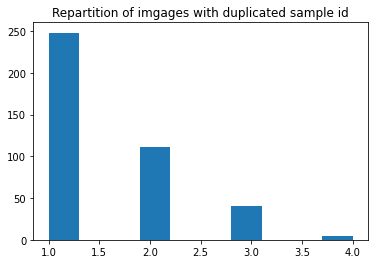

In [6]:
plt.hist(df.groupby(["sample_id"]).id.count());
plt.title("Repartition of imgages with duplicated sample id");
plt.show()

# DBScan with pretrained on imagenet

In [7]:
MEAN = np.array([0.66437738, 0.50478148, 0.70114894])
STD = np.array([0.15825711, 0.24371008, 0.13832686])
import albumentations as albu
from albumentations import pytorch as AT
normalizer = albu.Compose(
            [
                albu.Normalize(mean=MEAN, std=STD),
                AT.transforms.ToTensorV2(),
            ],
            p=1,
        )

In [8]:
class BasicDataset(Dataset):
    """
    Create tiles for predictions from a large image
    """
    def __init__(self,
                 df,
                 data_path=TRAIN_IMG_PATH,
                 transforms=normalizer):
        """
        Constructor.

        Args:
            df (pandas dataframe): Metadata.
            transforms (albumentation transforms, optional): Transforms to apply. Defaults to normalizer.
            data_path (str, optional): Indicates location of images. Defaults to TRAIN_IMG_PATH.
        """
        
        self.df = df
        self.transforms = transforms
        self.data_path = data_path

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        
        img_name = self.df.loc[idx, "id"]
        img_path = self.data_path + img_name + ".png"
        img = cv2.imread(img_path)
        
        if self.transforms:
            output = self.transforms(image=img)["image"]
        return output


In [9]:
BS = 8
device = "cuda"
dataset = BasicDataset(df)
dataloader = DataLoader(dataset, shuffle=False, batch_size=BS, drop_last=False)

encoder = "resnet18"
decoder = "Unet"

image_encoder = SimpleEncoder(decoder, encoder).to(device)

In [10]:
encoded_images = []

with torch.no_grad():
    for batch in dataloader:
        batch = batch.to(device).float()
        
        current_bs = len(batch)
        encoded_batch = image_encoder(batch).detach().cpu().numpy().reshape(current_bs, -1)         
        encoded_images.append(encoded_batch)
        
encoded_images = np.vstack(encoded_images)

In [11]:
import scipy.spatial

distances = scipy.spatial.distance_matrix(encoded_images, encoded_images)
# eliminate half of the matrix
distances[np.tri(*distances.shape, k=-1)==0] = 1000

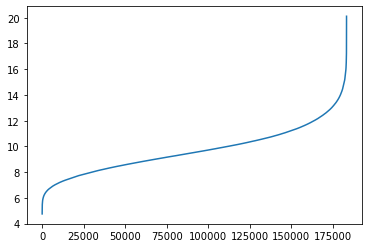

In [12]:
plt.plot(sorted(distances[distances<1000].reshape(-1)))

["ce453794c74d", "79b77c62a9f3"],


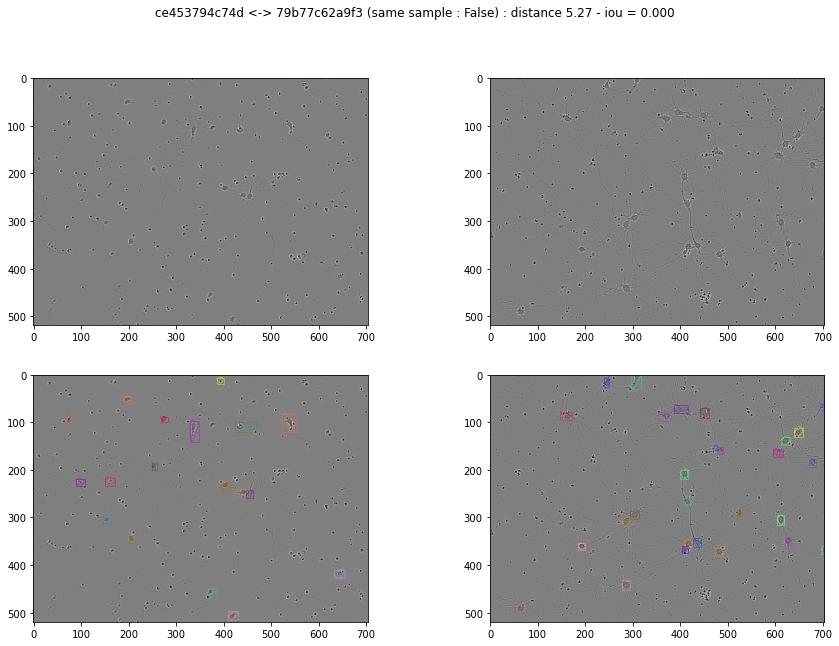

["e57626198284", "ca5df17f6717"],


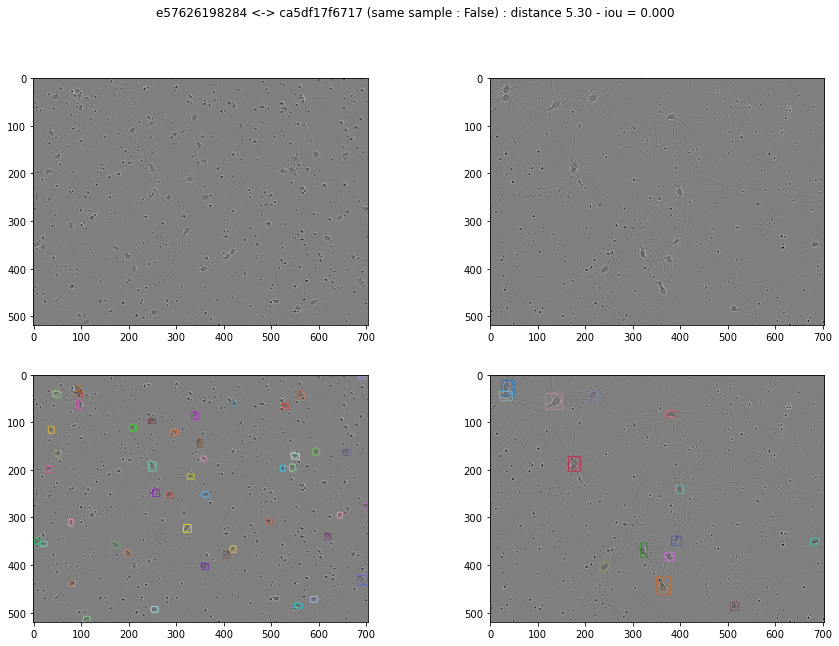

In [49]:
from ast import literal_eval
from utils.rle import rles_to_mask_fix
from utils.plots import plot_sample
from utils.metrics import iou_map

meta_data = pd.read_csv(OUT_PATH+"mmdet_data.csv")

height=520
width=704

for index_a, index_b in np.argwhere(distances<5.5): #6.5
    id_a = df.loc[index_a, "id"]
    id_b = df.loc[index_b, "id"]
    
    sample_id_a =  df.loc[index_a, "sample_id"]
    sample_id_b =  df.loc[index_b, "sample_id"]
    
    rles_a =  df.loc[index_a, "annotation"]
    rles_b =  df.loc[index_b, "annotation"]
    
    cell_a = df.loc[index_a, "cell_type"]
    cell_b = df.loc[index_b, "cell_type"]
    
    same_sample = sample_id_a == sample_id_b    
    if if not same_sample: # if not same_sample
        continue
        
    img_a = cv2.imread(TRAIN_IMG_PATH+id_a+".png")
    img_b = cv2.imread(TRAIN_IMG_PATH+id_b+".png")
    
    mask_a = rles_to_mask_fix(rles_a, (height, width), single_channel=False, fix=False)
    mask_b = rles_to_mask_fix(rles_b, (height, width), single_channel=False, fix=False)

    ann_a = literal_eval(meta_data[meta_data["filename"]==id_a+".png"].ann.values[0])
    ann_b = literal_eval(meta_data[meta_data["filename"]==id_b+".png"].ann.values[0])
    
    iou_score = iou_map([mask_a.max(0)], [mask_b.max(0)])
    
    print(f"""["{id_a}", "{id_b}"],""")
    fig = plt.figure(figsize=(15, 10))
    fig.add_subplot(2, 2, 1)
    plt.imshow(img_a)

    fig.add_subplot(2, 2, 2)
    plt.imshow(img_b)
    
    fig.add_subplot(2, 2, 3)
    plot_sample(img_a, mask_a.max(0), ann_a['bboxes'], width=1)

    fig.add_subplot(2, 2, 4)
    plot_sample(img_b, mask_b.max(0), ann_b['bboxes'], width=1)    
    
    fig.suptitle(f"{id_a} <-> {id_b} (same sample : {same_sample}) : distance {distances[index_a, index_b]:.2f} - iou = {iou_score:.3f}", fontsize=12)
    plt.show()

#     fig.suptitle(f"{cell_type} ({id_valid}): {val_iou} -> watershed {watershed_iou}", fontsize=16)

# Hand Data

In [16]:
close_neighbours = [
    ["3b3991c64f38", "1bf60e3be6ce"],
    ["56b8cad4f8e7", "23e6d1174f47"],
    ["5e9130834984", "40fddf5f9595"],
    ["6e8c9b707724", "1ef6aaa62132"],
    ["90016c8865d3", "0f7d009bc5d3"],
    ["9a065ab4fae7", "7f27bcdc5e5d"],
    ["9bc9775ee371", "6b2f2fab222f"],
    ["9c4661d1509c", "52e810d1f2f0"],
    ["a0ee7192f838", "60a7ba541038"],
    ["ad41b4c2bf73", "40db2225676e"],
    ["afbcea22fc2a", "01ae5a43a2ab"],
    ["b3990528329c", "499a225c835d"],
    ["b684e5076578", "5bc68ac7426e"],
    ["b81db12284ff", "624d50b5bfd1"],
    ["c98b451417f7", "4bdf75f87261"],
    ["ca5df17f6717", "bee779e5729d"],
    ["ce5d0de993bd", "172334437c88"],
    ["d248e894403c", "6e8c9b707724"],
    ["d7aa803f5b5f", "1d2ca29fef3e"],
    ["ec5b56d79061", "ce5d0de993bd"],
    
]

similar = [
    ["40db2225676e", "2099abcae734"],
    ["7b2818817d0d", "083b178bb184"],
    ["7d59ab1d21a2", "6b2f2fab222f"],
    ["86be12afefb6", "5eb16b1cf176"],
    ["89dceefff181", "16e538bbe8c5"],
    ["93ce48e5227c", "856cbd30d034"],
    ["9bc9775ee371", "7d59ab1d21a2"],
    ["ad41b4c2bf73", "2099abcae734"],
    ["b0c3bd326249", "01ae5a43a2ab"],
    ["c48e1469ac98", "03b27b381a5f"],
    ["c895cf319088", "0ba181d412da"],
    ["d248e894403c", "1ef6aaa62132"],
    ["dc18ef9b49f5", "b50a98297c83"],
    ["e013dbefe5c4", "061b49d7dbbb"],
    ["e767fd549540", "7ad870da5a63"],
    ["ec5b56d79061", "172334437c88"],
    ["ececc1fe265d", "86be12afefb6"],
    ["f40567565202", "0eca9ecf4987"],
    ["f6e7e998a190", "e97e043aa093"],
]

big_problem = [["bf44c49ba659", "95de75855f80"],
               ["d8fc6dd956f8", "7b27ca965a93"],
               ["e33d521aa9de", "03b27b381a5f"],
               ["e92c56871769", "2dc940ff1a71"],
               ["eec79772cb99", "35fc12883459"],

              ]

In [31]:
len(set(np.hstack([np.array(close_neighbours).reshape(-1), np.array(big_problem).reshape(-1), np.array(similar).reshape(-1)])))

73

["40db2225676e", "2099abcae734"],


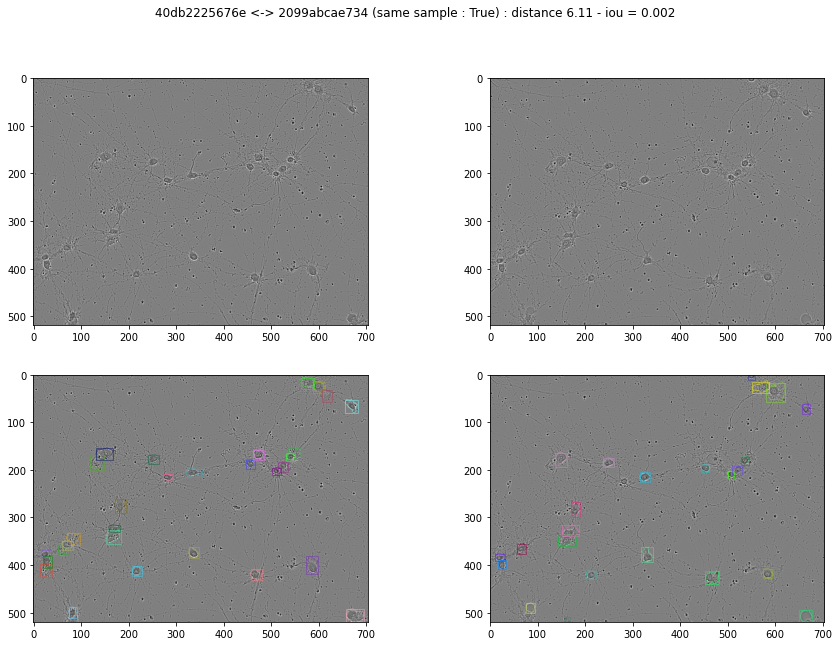

["7b2818817d0d", "083b178bb184"],


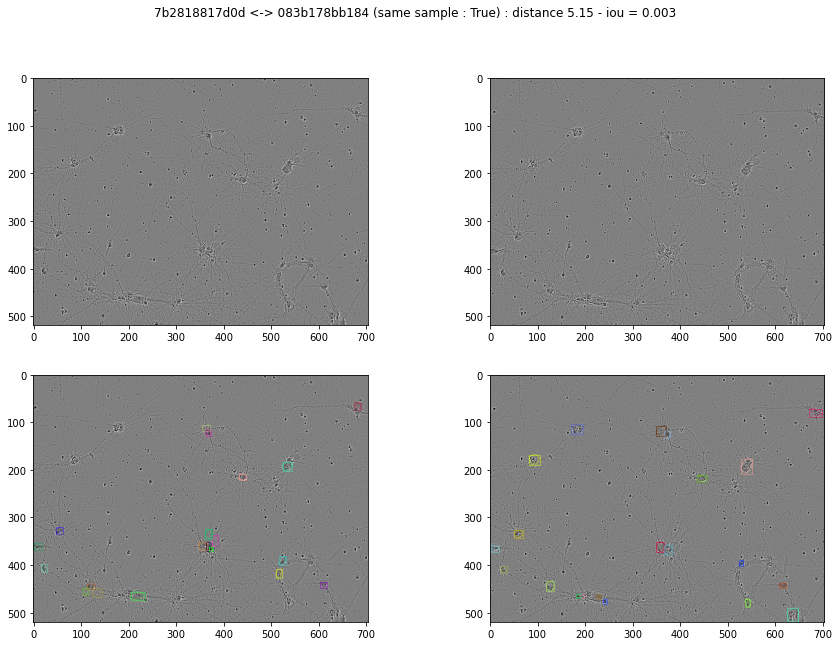

["7d59ab1d21a2", "6b2f2fab222f"],


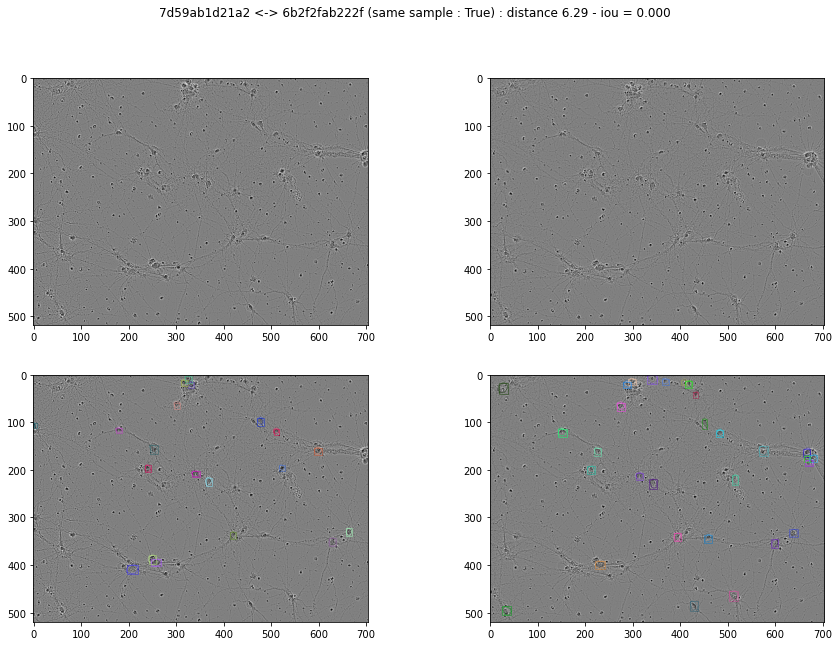

["86be12afefb6", "5eb16b1cf176"],


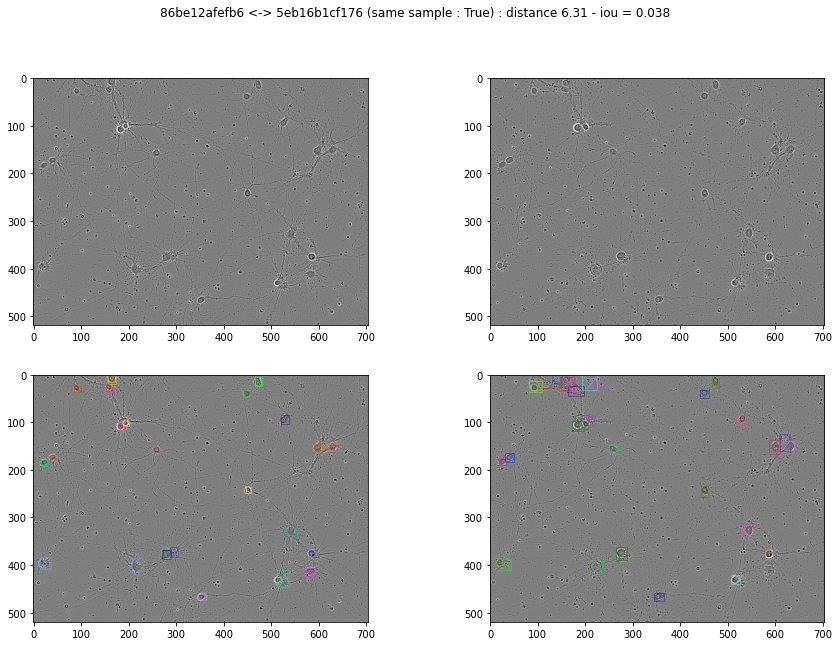

["89dceefff181", "16e538bbe8c5"],


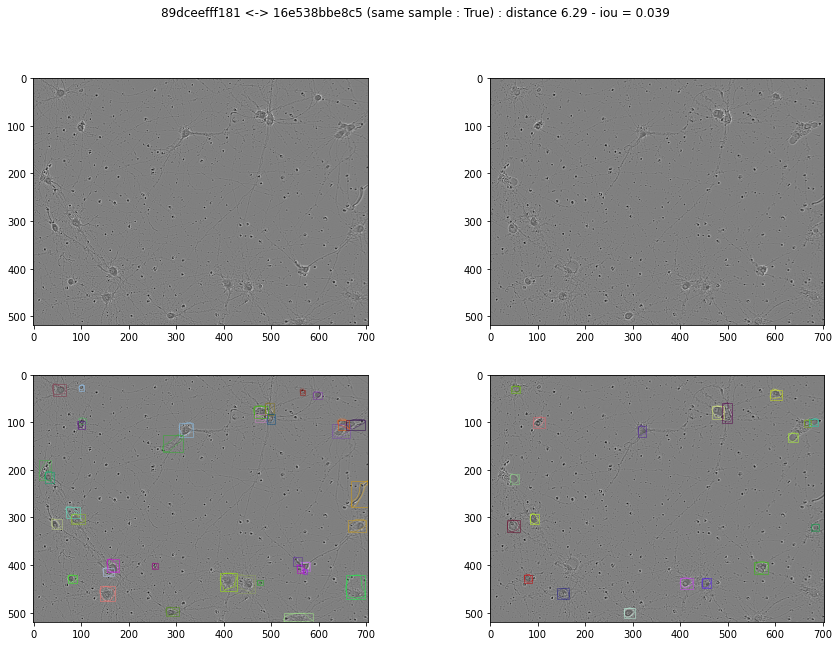

["93ce48e5227c", "856cbd30d034"],


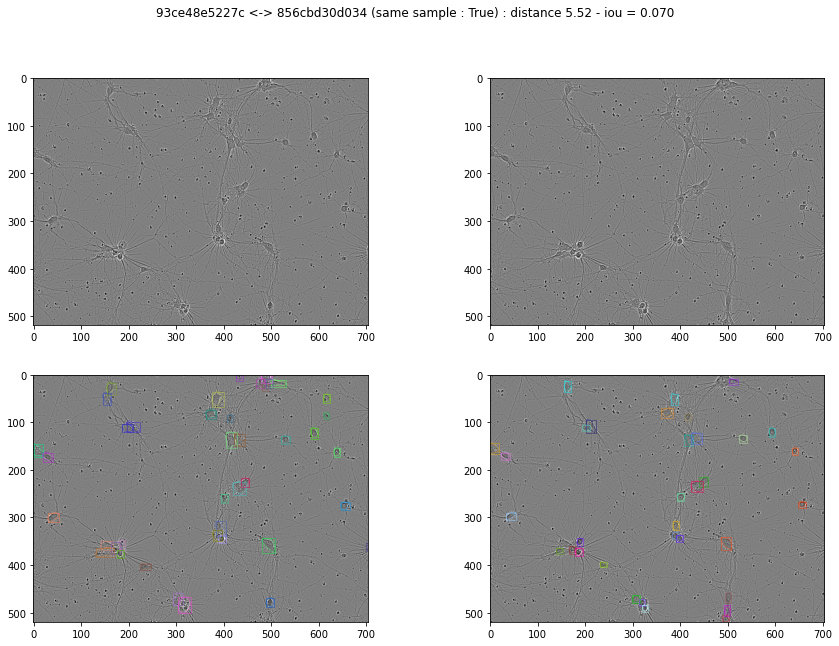

["9bc9775ee371", "7d59ab1d21a2"],


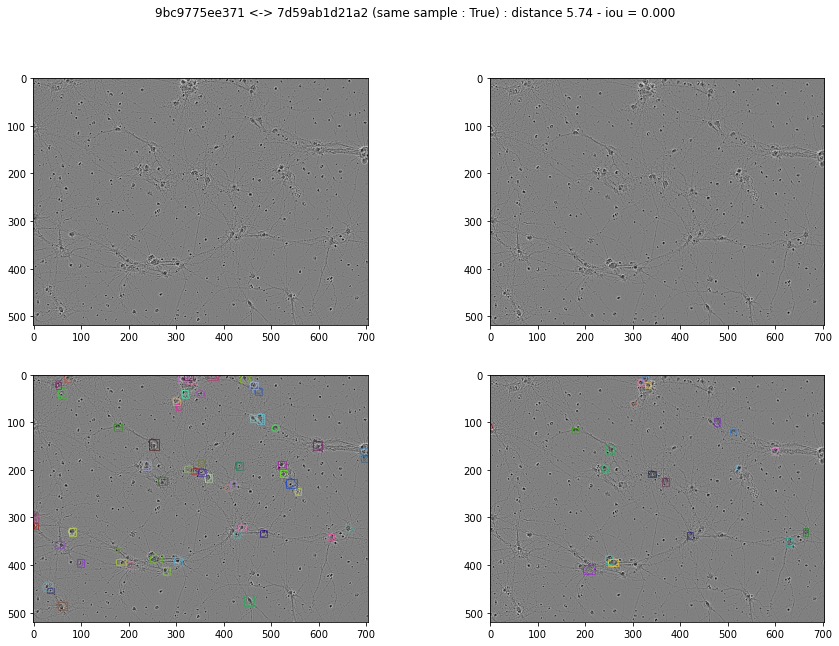

["ad41b4c2bf73", "2099abcae734"],


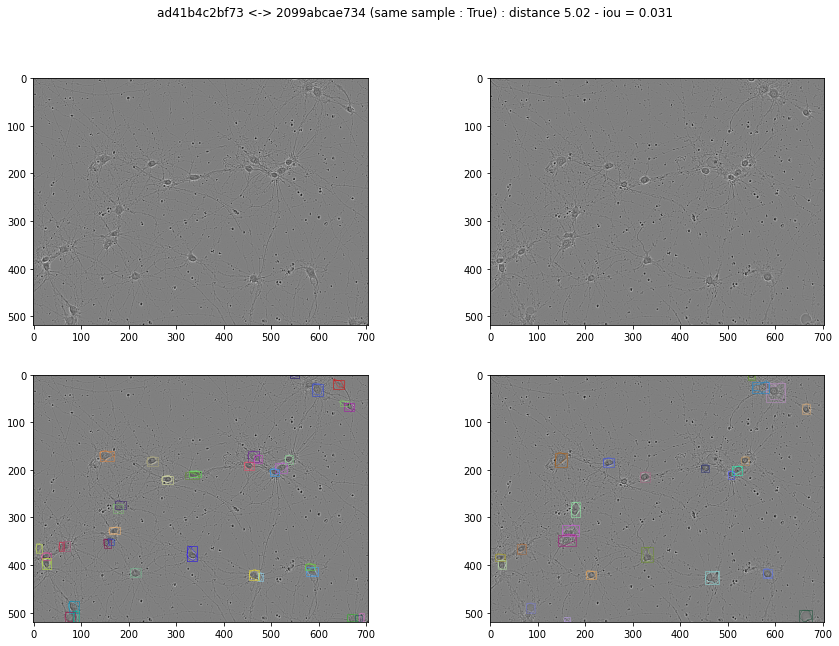

["b0c3bd326249", "01ae5a43a2ab"],


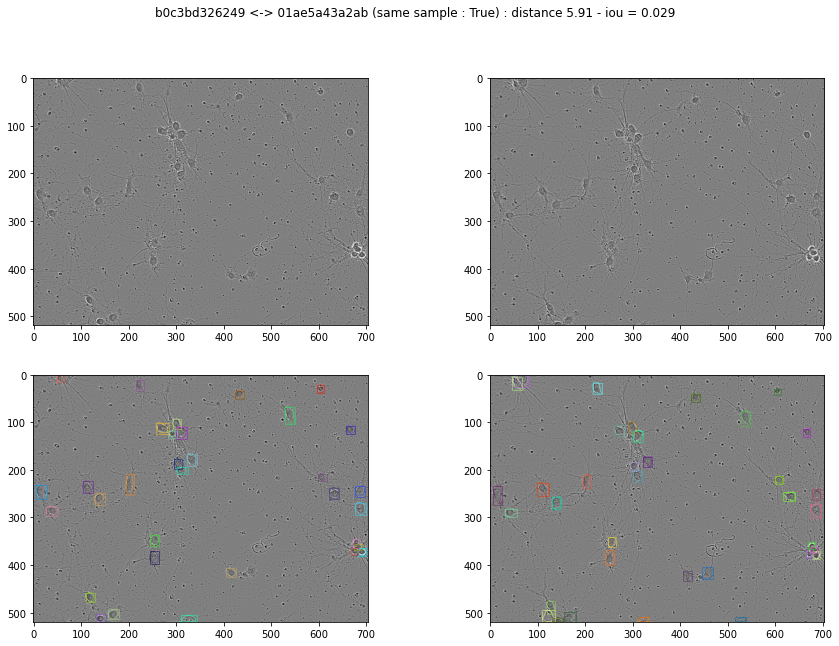

["c48e1469ac98", "03b27b381a5f"],


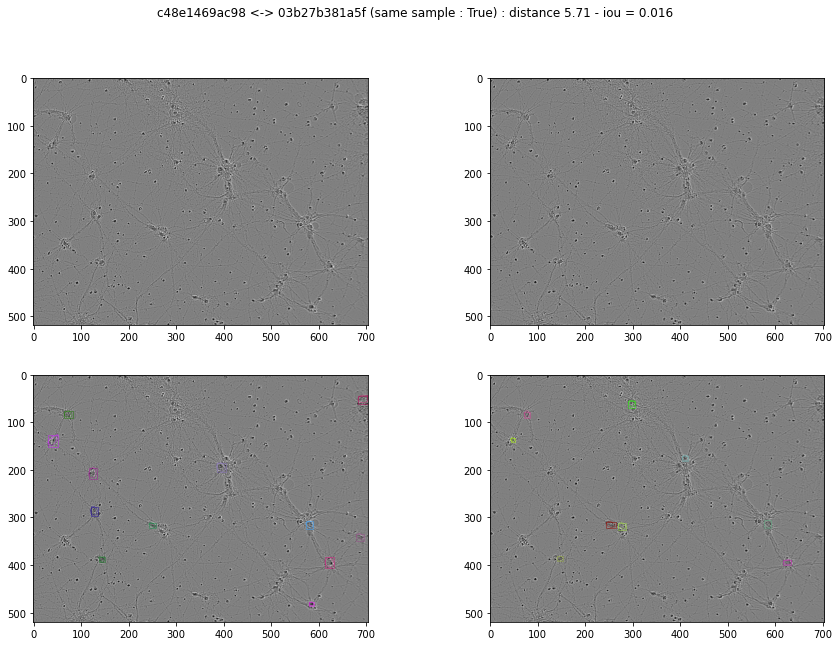

["c895cf319088", "0ba181d412da"],


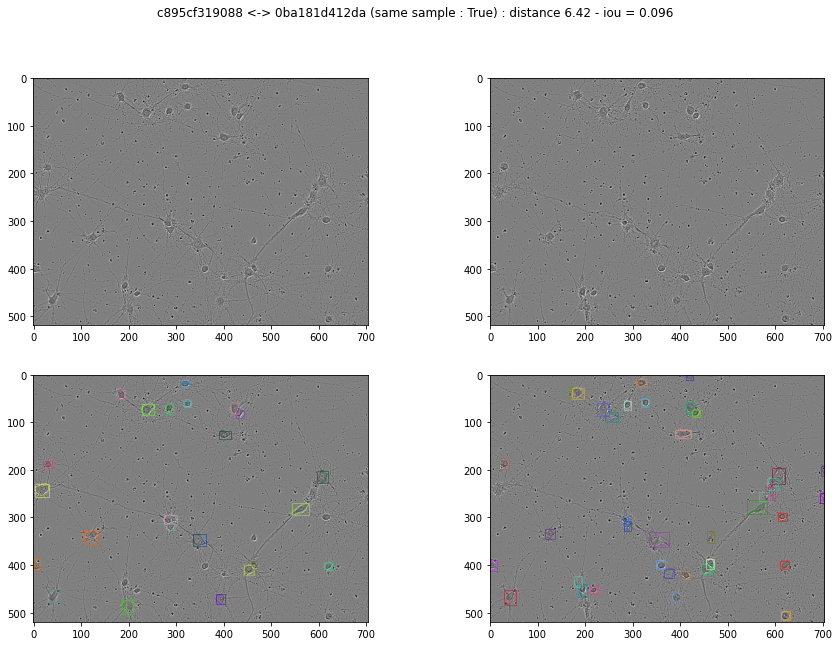

["d248e894403c", "1ef6aaa62132"],


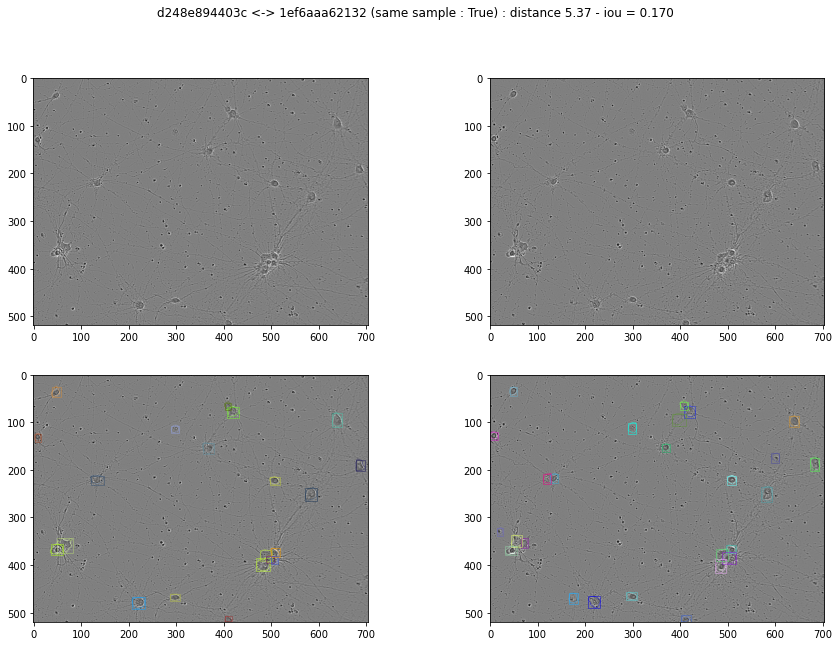

["dc18ef9b49f5", "b50a98297c83"],


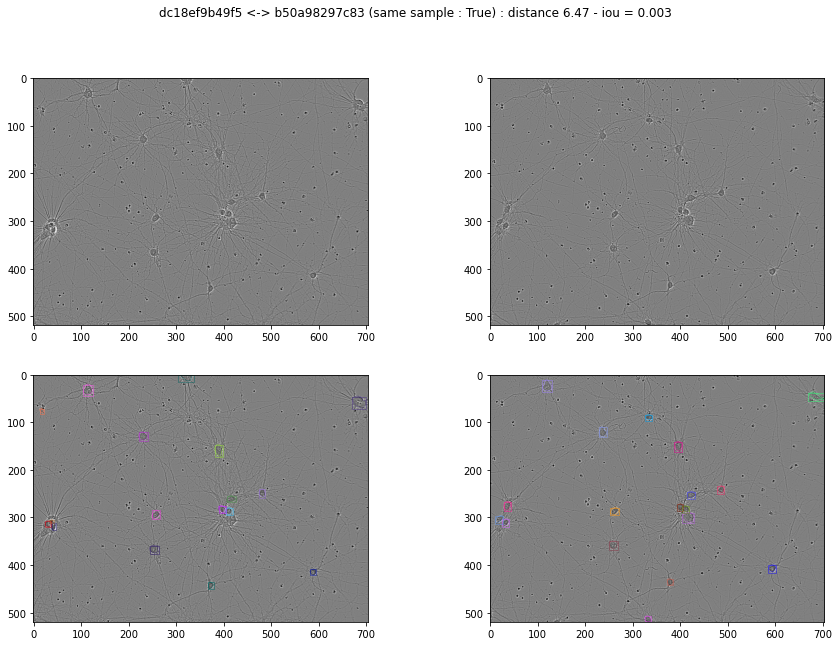

["e013dbefe5c4", "061b49d7dbbb"],


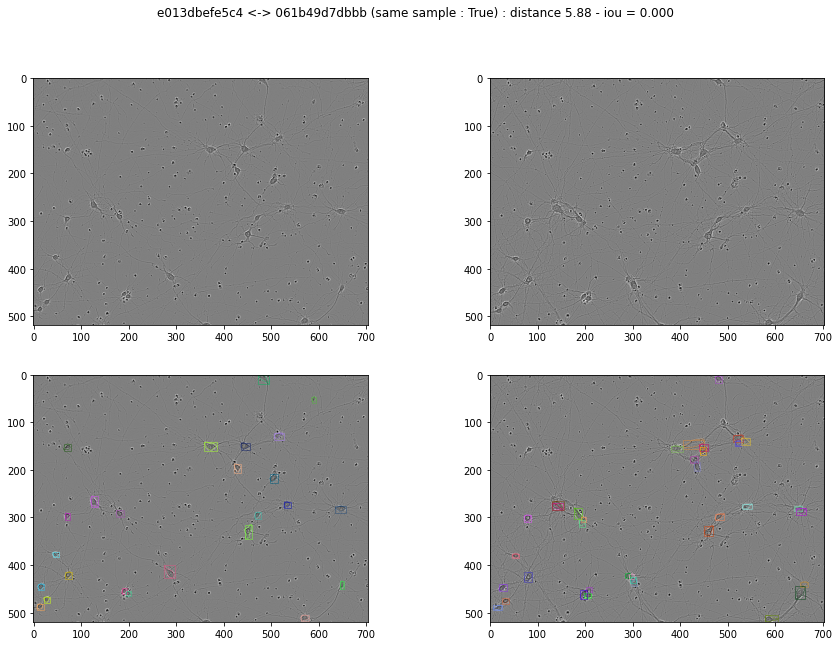

["e767fd549540", "7ad870da5a63"],


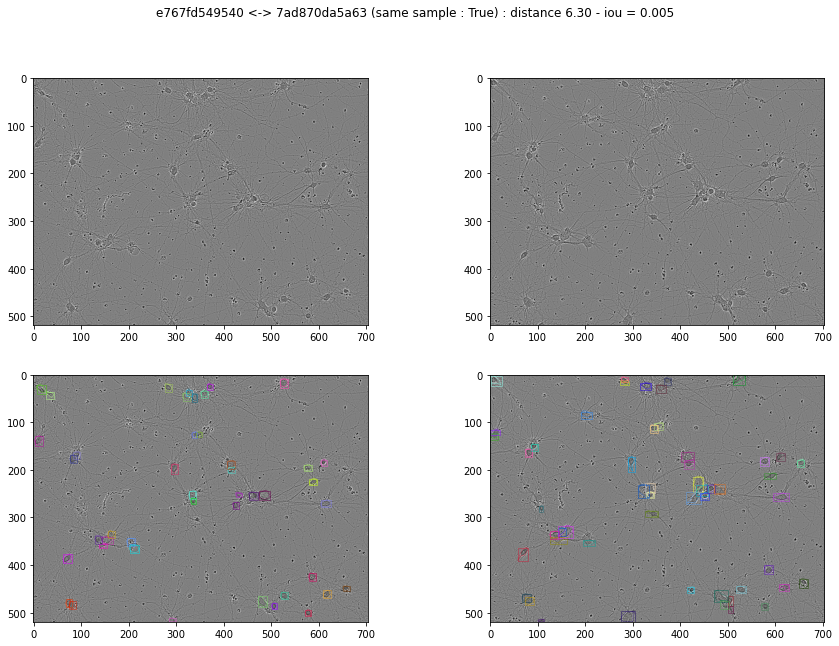

["ec5b56d79061", "172334437c88"],


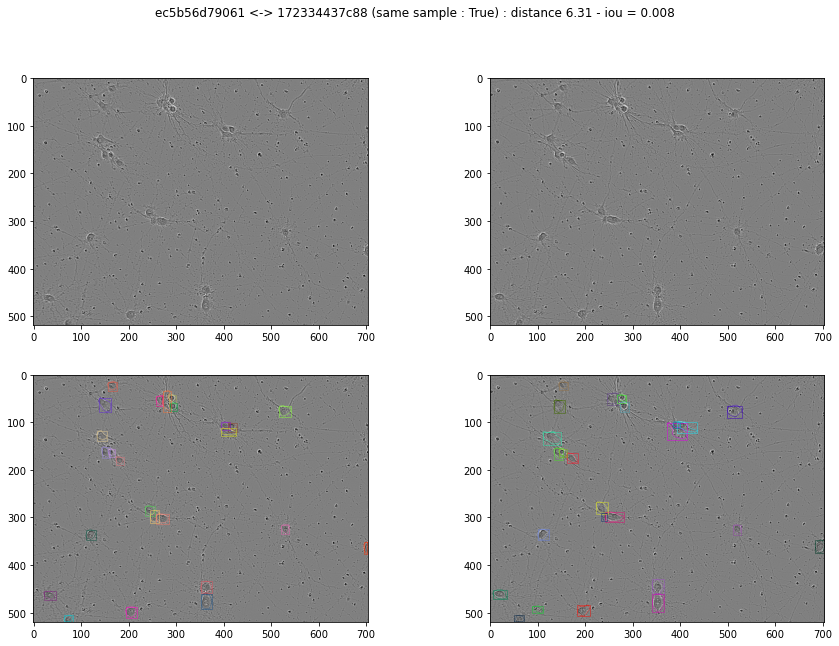

["ececc1fe265d", "86be12afefb6"],


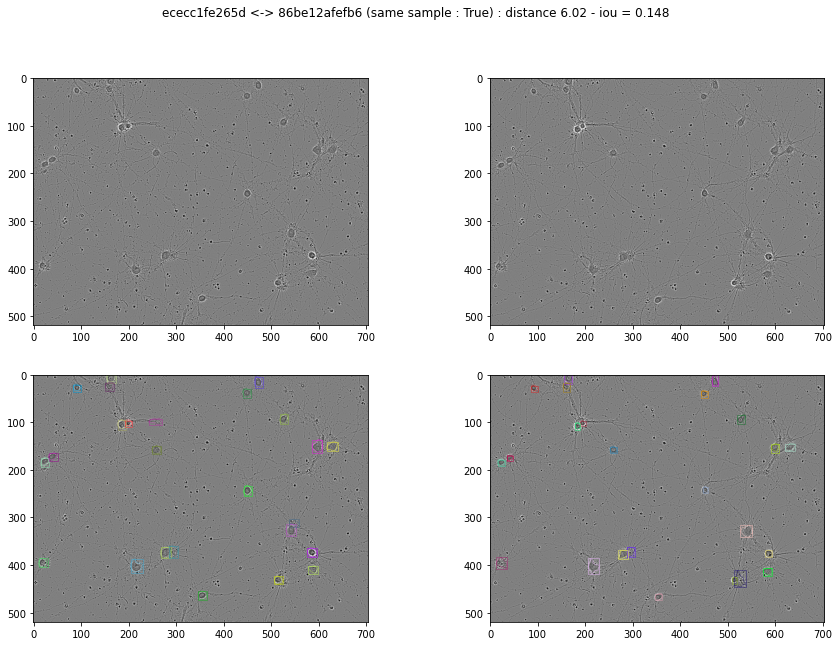

["f40567565202", "0eca9ecf4987"],


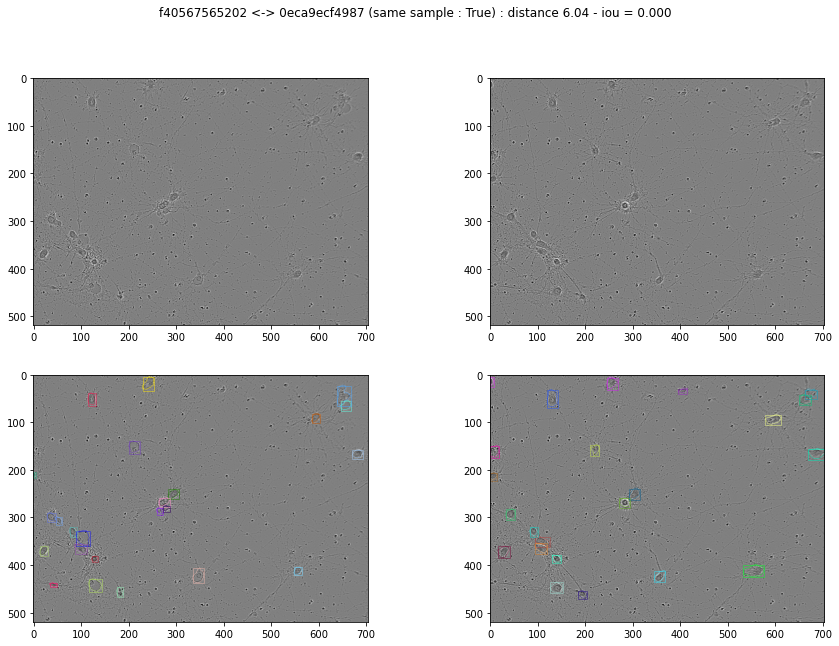

["f6e7e998a190", "e97e043aa093"],


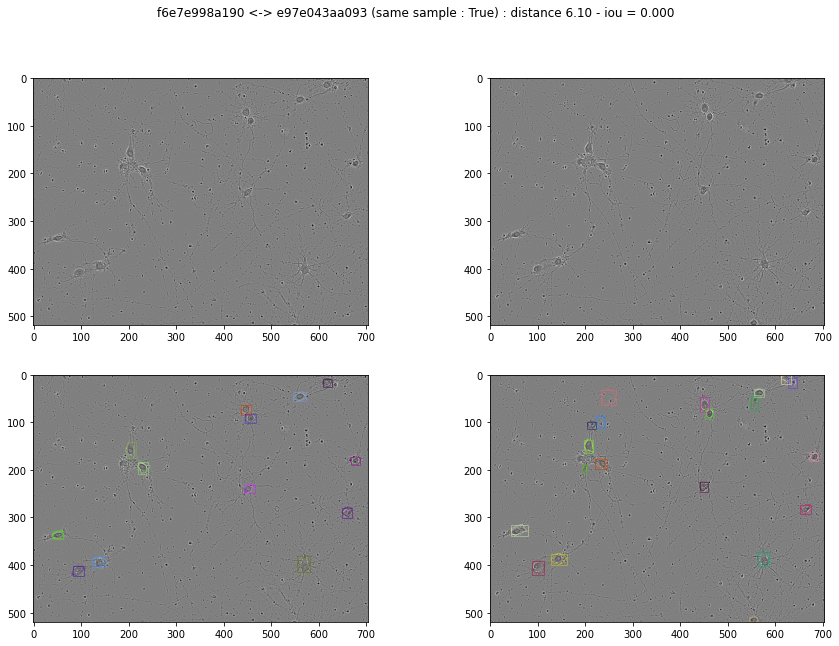

In [33]:
from ast import literal_eval
from utils.rle import rles_to_mask_fix
from utils.plots import plot_sample
from utils.metrics import iou_map

meta_data = pd.read_csv(OUT_PATH+"mmdet_data.csv")

height=520
width=704

for name_a, name_b in similar: #6.5
    index_a = df[df.id==name_a].index[0]
    index_b = df[df.id==name_b].index[0]
    
    id_a = df.loc[index_a, "id"]
    id_b = df.loc[index_b, "id"]
    
    sample_id_a =  df.loc[index_a, "sample_id"]
    sample_id_b =  df.loc[index_b, "sample_id"]
    
    rles_a =  df.loc[index_a, "annotation"]
    rles_b =  df.loc[index_b, "annotation"]
    
    cell_a = df.loc[index_a, "cell_type"]
    cell_b = df.loc[index_b, "cell_type"]
    
    same_sample = sample_id_a == sample_id_b    
        
    img_a = cv2.imread(TRAIN_IMG_PATH+id_a+".png")
    img_b = cv2.imread(TRAIN_IMG_PATH+id_b+".png")
    
    mask_a = rles_to_mask_fix(rles_a, (height, width), single_channel=False, fix=False)
    mask_b = rles_to_mask_fix(rles_b, (height, width), single_channel=False, fix=False)

    ann_a = literal_eval(meta_data[meta_data["filename"]==id_a+".png"].ann.values[0])
    ann_b = literal_eval(meta_data[meta_data["filename"]==id_b+".png"].ann.values[0])
    
    iou_score = iou_map([mask_a.max(0)], [mask_b.max(0)])
    print(f"""["{id_a}", "{id_b}"],""")
    fig = plt.figure(figsize=(15, 10))
    fig.add_subplot(2, 2, 1)
    plt.imshow(img_a)

    fig.add_subplot(2, 2, 2)
    plt.imshow(img_b)
    
    fig.add_subplot(2, 2, 3)
    plot_sample(img_a, mask_a.max(0), ann_a['bboxes'], width=1)

    fig.add_subplot(2, 2, 4)
    plot_sample(img_b, mask_b.max(0), ann_b['bboxes'], width=1)    
    
    fig.suptitle(f"{id_a} <-> {id_b} (same sample : {same_sample}) : distance {distances[index_a, index_b]:.2f} - iou = {iou_score:.3f}", fontsize=12)
    plt.show()

["bf44c49ba659", "95de75855f80"],


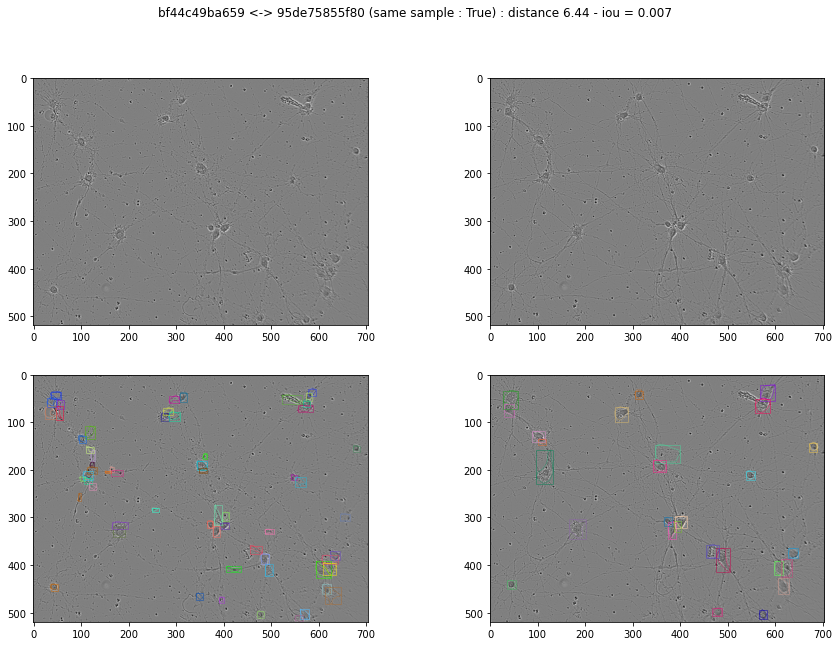

["d8fc6dd956f8", "7b27ca965a93"],


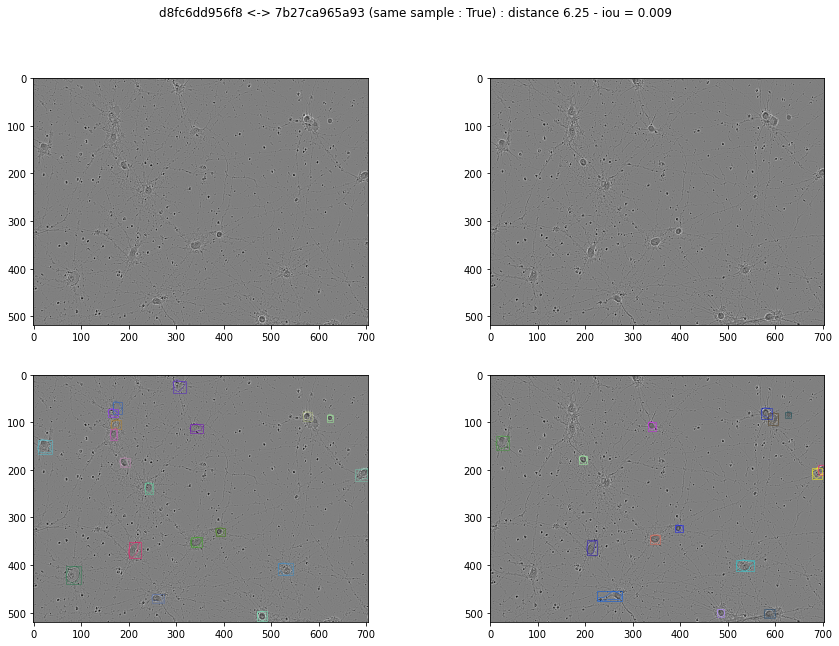

["e33d521aa9de", "03b27b381a5f"],


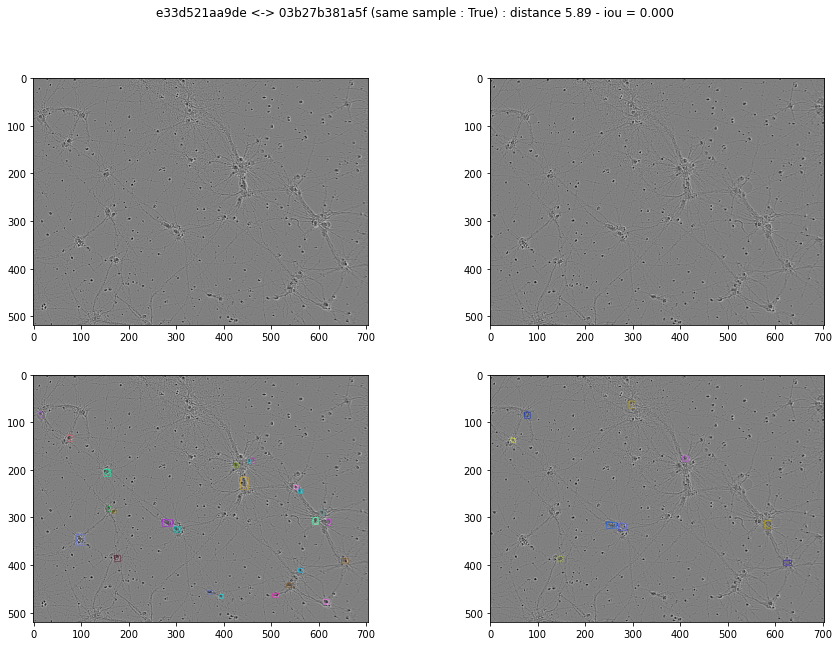

["e92c56871769", "2dc940ff1a71"],


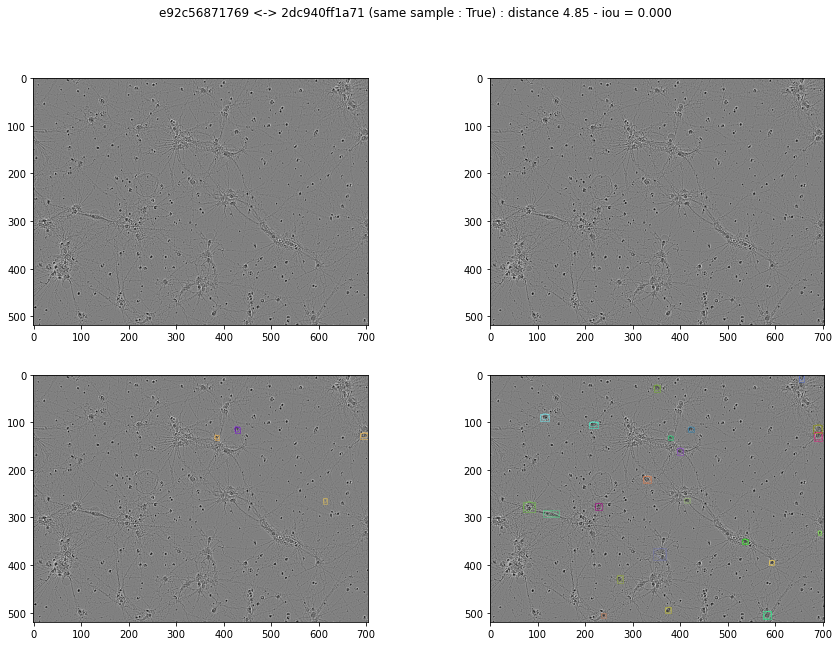

["eec79772cb99", "35fc12883459"],


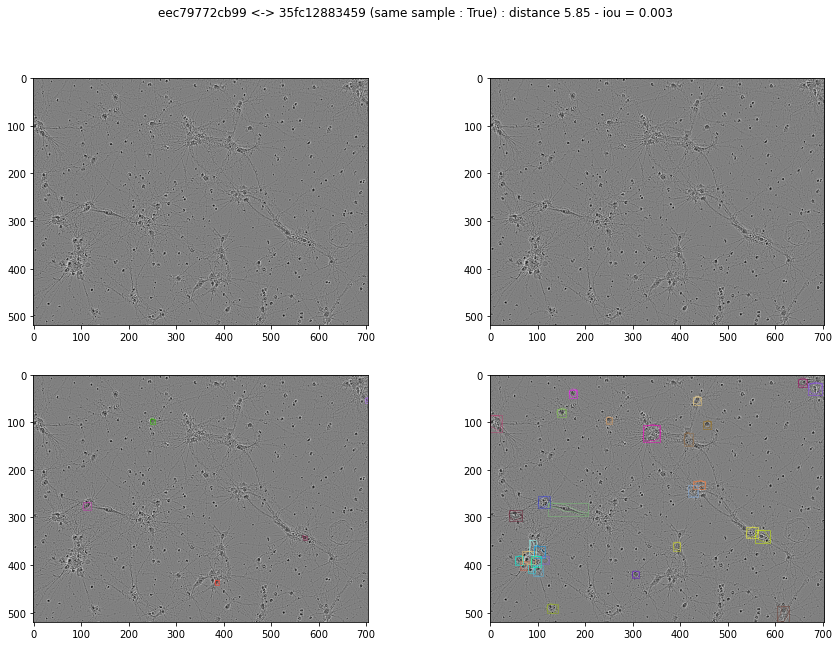

In [32]:
from ast import literal_eval
from utils.rle import rles_to_mask_fix
from utils.plots import plot_sample
from utils.metrics import iou_map

meta_data = pd.read_csv(OUT_PATH+"mmdet_data.csv")

height=520
width=704

for name_a, name_b in big_problem: #6.5
    index_a = df[df.id==name_a].index[0]
    index_b = df[df.id==name_b].index[0]
    
    id_a = df.loc[index_a, "id"]
    id_b = df.loc[index_b, "id"]
    
    sample_id_a =  df.loc[index_a, "sample_id"]
    sample_id_b =  df.loc[index_b, "sample_id"]
    
    rles_a =  df.loc[index_a, "annotation"]
    rles_b =  df.loc[index_b, "annotation"]
    
    cell_a = df.loc[index_a, "cell_type"]
    cell_b = df.loc[index_b, "cell_type"]
    
    same_sample = sample_id_a == sample_id_b    
        
    img_a = cv2.imread(TRAIN_IMG_PATH+id_a+".png")
    img_b = cv2.imread(TRAIN_IMG_PATH+id_b+".png")
    
    mask_a = rles_to_mask_fix(rles_a, (height, width), single_channel=False, fix=False)
    mask_b = rles_to_mask_fix(rles_b, (height, width), single_channel=False, fix=False)

    ann_a = literal_eval(meta_data[meta_data["filename"]==id_a+".png"].ann.values[0])
    ann_b = literal_eval(meta_data[meta_data["filename"]==id_b+".png"].ann.values[0])
    
    iou_score = iou_map([mask_a.max(0)], [mask_b.max(0)])
    print(f"""["{id_a}", "{id_b}"],""")
    fig = plt.figure(figsize=(15, 10))
    fig.add_subplot(2, 2, 1)
    plt.imshow(img_a)

    fig.add_subplot(2, 2, 2)
    plt.imshow(img_b)
    
    fig.add_subplot(2, 2, 3)
    plot_sample(img_a, mask_a.max(0), ann_a['bboxes'], width=1)

    fig.add_subplot(2, 2, 4)
    plot_sample(img_b, mask_b.max(0), ann_b['bboxes'], width=1)    
    
    fig.suptitle(f"{id_a} <-> {id_b} (same sample : {same_sample}) : distance {distances[index_a, index_b]:.2f} - iou = {iou_score:.3f}", fontsize=12)
    plt.show()

In [ ]:
exclude_from_training = ["03b27b381a5f", "e92c56871769", "eec79772cb99"]